<font size=6><b>**Анализ данных в индустрии 2023 (Тинькофф)**</b></font>
    
<font size=6><b>**Проект №2. A/B тесты**</b></font>

***

# Постановка задачи

В рамках проекта выполнено задание, условие которого приведено ниже.
Контрольные и тестовые выборки генерировались в телеграмм-боте, что имитировало процесс проведения самого А/В теста. 

**Контекст**  
Мы много платим оператору из-за того,
что он сам по каждому заданию
звонит клиенту и ждёт ответа клиента.
Мы хотим снизить затраты на операторов,
внедрив систему,
которая будет сама звонить человеку
и в случае успеха перенаправлять задание оператору.
        
**Тест**  
Мы проводим тест,
в рамках которого весь поток клиентов разбивается
на две части рановероятно.
Одной части (контроль) продажи ведутся 
без автоматической системы дозвона,
а второй части (тест) - с ней.
Целью этого теста
является снижение расходов на дозвон.

**Статистические вводные**  
Уровень значимости 5%.
Различие 5%-ного 
изменения целевой метрики должно осуществляться
с вероятностью 90%.


# Подготовка окружения

Загрузим библиотеки, необходимые для выполнения проекта.

In [1]:
# Нестандартные библиотеки
# !pip install nb-black
# !pip install phik
# !pip install hyppo

In [2]:
%load_ext lab_black

In [3]:
import numpy as np
import pandas as pd
import phik
import plotly.graph_objects as go
import random
import seaborn as sns
import warnings

from hyppo.ksample import Energy, MMD, DISCO
from matplotlib import pyplot as plt
from scipy.stats import (
    laplace,
    norm,
    ks_2samp,
    anderson_ksamp,
    cramervonmises_2samp,
    ttest_ind,
)
from statsmodels.distributions.empirical_distribution import ECDF
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.weightstats import ztest
from tqdm.notebook import tqdm

In [4]:
warnings.filterwarnings("ignore")

# Загрузка исторических данных

Загрузим исторические данные и проведем их экспресс анализ

In [ ]:
df_hist_task_1 = pd.read_csv("telesales_hist.csv", index_col="ID")

In [ ]:
df_hist_task_1.head()

,Флаг дозвона,Флаг продажи,Расходы,PV,NPV
ID,,,,,
0,1,0,90,0,-90
1,0,0,5,0,-5
2,0,0,68,0,-68
3,1,0,22,0,-22
4,1,0,22,0,-22


In [ ]:
df_hist_task_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72161 entries, 0 to 72160
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   Флаг дозвона  72161 non-null  int64
 1   Флаг продажи  72161 non-null  int64
 2   Расходы       72161 non-null  int64
 3   PV            72161 non-null  int64
 4   NPV           72161 non-null  int64
dtypes: int64(5)
memory usage: 3.3 MB


Среди исторических данных 72161 объекта, пропуски отсутсвуют.

Для удобства работы переименуем столбцы и построим сводные таблицы по первым двум флагам.

In [ ]:
columns_t1 = [
    "call_flag",
    "sale_flag",
    "costs",
    "pv",
    "npv",
]

df_hist_task_1.columns = columns_t1

In [ ]:
df_hist_task_1.groupby(by="call_flag")[["sale_flag", "costs", "pv", "npv"]].agg(
    ["mean", "median"]
)

sale_flag              costs                 pv                 npv  \
               mean median        mean median        mean  median        mean   
call_flag                                                                       
0          0.000000    0.0   48.996710   33.0    0.000000     0.0  -48.996710   
1          0.503719    1.0  301.688297  108.0  803.561865  1202.0  501.873568   

                  
          median  
call_flag         
0          -33.0  
1           -2.0

In [ ]:
print("Доля дозвонов по всем историческим данным:", df_hist_task_1["call_flag"].mean())

Доля дозвонов по всем историческим данным: 0.5998808220506922


In [ ]:
df_hist_task_1.groupby(by="sale_flag")[["costs", "pv", "npv"]].agg(["mean", "median"])

costs                  pv                  npv        
                 mean median         mean  median         mean  median
sale_flag                                                             
0           49.189173   34.0     0.000000     0.0   -49.189173   -34.0
1          550.203852  396.0  1595.257326  1426.0  1045.053474  1062.0

Из полученных данных видно, что если дозвон состоялся, то:
- средние и медианные значения NPV существенно отличаются, что говорит о наличии выбросов и нехарактерных значениях.
При этом для цены и NPV отличие в худшую для бизнеса сторону;
- медианное значение NPV отрицательно даже в случае дозвона, что подтверждает наличие проблем в сервисе и необходимости его модернизации;
- продажа происходит только в 50% случаев, при которых медианные значения затрат, PV, NPV отличаются от средних значений незначительно.

Учитывая, что поставленная цель - снизить затраты на операторов, в качестве целевой метрики настоящего тестирования целесообразно выбрать среднее значение costs.
При этом медианное значение NPV будем использовать в качестве guardrall, а процент *НЕ*дозвонов и *НЕ*продаж - в качестве прокси-метрик. 

# Формулирование гипотез

Для настоящего тестирования сформулируем гипотезу следующим образом:  
**Н0: Средние значения costs контрольной и тестовой выборок не изменились.**

Тогда альтернативой гипотезе будет:  
**Н1: Среднее значение costs на контрольной выборке больше аналогичного значения на тестовой.**

Согласно условию задачи: 
- уровень значимости равен 5%;
- мощность теста составляет 90%; 
- ожидаемый эффект: изменение среднего значения costs на 5%.

Посчитаем размер выборки, применив формулу

$$
N = \frac{2 \cdot \sigma ^ 2 \cdot (z_a - z_b) ^ 2}{\Delta ^ 2},
$$

где $\sigma ^ 2$ - дисперсия выборки,  
$z_a$ и $z_b$ - квантиль стандартного нормального распределения,  
$\Delta$ - ожидаемый аплифт.

In [ ]:
def sample_size(df, alpha, betta, uplift):
    sigma = df.std()
    z_a = norm.ppf(1 - alpha)
    z_b = norm.ppf(1 - betta)
    mde = uplift * df.mean()

    return np.round(2 * sigma**2 * (z_a - z_b) ** 2 / mde**2, 0)

In [ ]:
sample_size_t1 = sample_size(
    df_hist_task_1["costs"], alpha=0.05, betta=0.9, uplift=0.05
)

print("Размер каждой выборки для задачи №1 составляет:", sample_size_t1)

Размер каждой выборки для задачи №1 составляет: 22531.0


Получив размер выборки, просемплируем 1000 раз исторические данные и проведем на них А/А тестирование.  
Учитывая, что цель - сравнение двух выборочных средних при известной дисперсии, будем использовать т-тест.

Условием применения указанного инструмента является нормальное распределение среднего, для проверки чего построим сразу гистограмму его распределения и QQ-plot.

In [ ]:
def a_a_test(df, feature, alpha, sample_size, alternative):
    random_state = np.random.RandomState(26)
    test_iterations = 1000

    sample_size = int(sample_size)

    means = []
    pvalues = []

    print("Сэмплирование:")
    for i in tqdm(range(test_iterations)):
        sample_a1 = df.sample(sample_size, random_state=random_state)
        sample_a2 = df.sample(sample_size, random_state=random_state)

        pvalues.append(
            ttest_ind(
                sample_a1[feature],
                sample_a2[feature],
                equal_var=False,
                random_state=random_state,
                alternative=alternative,
            )[1]
        )

        means.append(sample_a1[feature].mean())
        means.append(sample_a2[feature].mean())

    fig = go.Figure()
    fig.add_trace(
        go.Scatter(
            x=[1, test_iterations], y=[alpha, alpha], name="Заданный уровень значимости"
        )
    )
    fig.add_trace(
        go.Scatter(
            x=1 + np.arange(test_iterations),
            y=pvalues,
            name="Расчетное значение p-value",
        )
    )
    fig.update_layout(
        title="Результаты А/А теста",
        xaxis_title="Количество итераций",
        yaxis_title="Значение p-value",
    )
    fig.show()

    errors = [x for x in pvalues if x < 0.05]
    print(f"Доля ошибок теста: {len(errors) / len(pvalues)}")

    _, ax = plt.subplots(1, 2, figsize=(12, 5))
    sns.histplot(means, ax=ax[0])
    qqplot(np.array(means), dist=norm, line="s", ax=ax[1])
    plt.suptitle("Проверка норамльности рапределения целевой метрики")

    plt.show()

Сэмплирование:


  0%|          | 0/1000 [00:00<?, ?it/s]

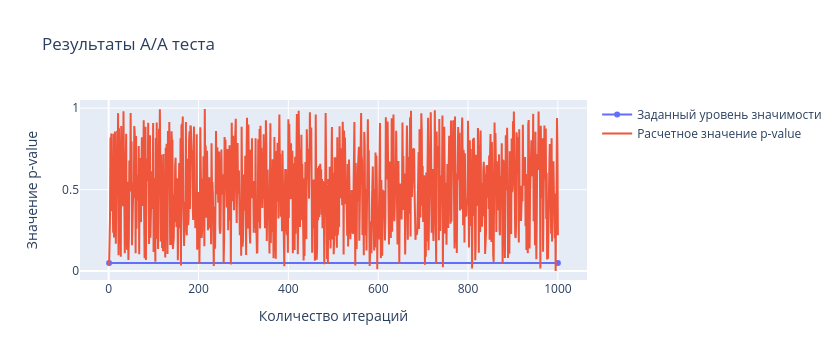

Доля ошибок теста: 0.02


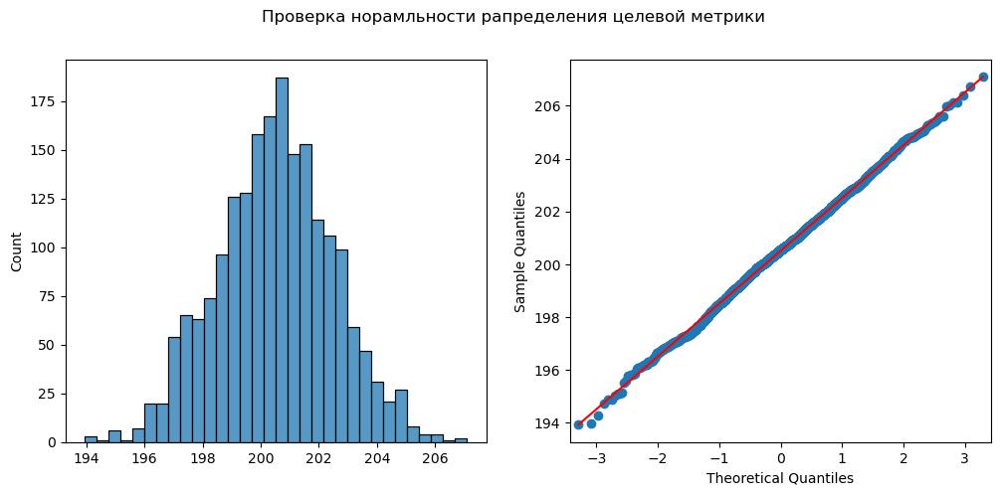

In [ ]:
a_a_test(df_hist_task_1, "costs", 0.05, sample_size_t1, "greater")

Результат теста показывает ожидаемый результат: отсутствие статистически значимых изменений между двумя выборками. 
При этом, доля ошибок теста меньше заданного критерия в 5%.

Проверка распределения среднего подтвердила его нормальный вид.

# Тестирование

Контрольная и тестовая выборки получены через телеграм-бот.

Загрузим их и переименуем столбцы.

In [ ]:
control_t1 = pd.read_csv("telesales_control.csv", index_col="ID")
test_t1 = pd.read_csv("telesales_test.csv", index_col="ID")

control_t1.columns = columns_t1
test_t1.columns = columns_t1

Перед запуском самого теста проверим прокси метрики.

In [ ]:
def secondary_metrics(df_hist, control, test, feature):
    control_means = []
    test_means = []
    iterations = len(control)

    for i in range(iterations):
        control_means.append(control[feature][:i].mean())
        test_means.append(test[feature][:i].mean())

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=[1, iterations],
            y=[df_hist[feature].mean(), df_hist[feature].mean()],
            name="Историческое значение",
        )
    )

    fig.add_trace(
        go.Scatter(
            x=1 + np.arange(iterations),
            y=control_means,
            name="Значение на контроле",
        )
    )

    fig.add_trace(
        go.Scatter(
            x=1 + np.arange(iterations),
            y=test_means,
            name="Значение на тесте",
        )
    )

    fig.update_xaxes(type="log")
    fig.update_layout(
        title=f"Проверка параметра {feature}",
        xaxis_title="Размер выборки",
        yaxis_title="Значение параметра",
    )
    fig.show()

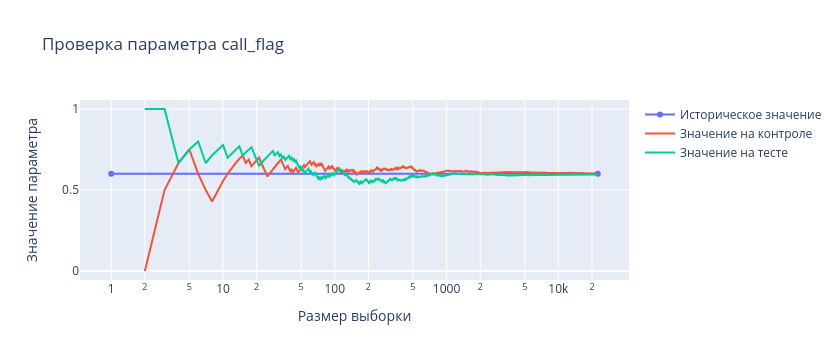

In [ ]:
secondary_metrics(df_hist_task_1, control_t1, test_t1, "call_flag")

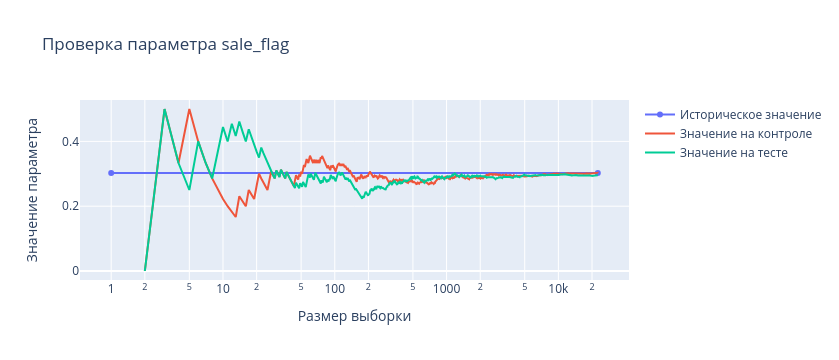

In [ ]:
secondary_metrics(df_hist_task_1, control_t1, test_t1, "sale_flag")

Из графиков видно, что доля дозвонов и покупок в предельных значениях не изменились от исторических.
В то же время, обе метрики для тестовой выборки несколько быстрее пришли к указанному значению, что позволяет сделать предположение об успешности теста.

Проверим целевую метрику при помощи Т-теста.

In [ ]:
def a_b_test(df_a, df_b, feature, alpha, alternative):
    pvalue = ttest_ind(
        df_a[feature],
        df_b[feature],
        equal_var=False,
        random_state=26,
        alternative=alternative,
    )[1]

    print(f"p-value = {pvalue}")

    if pvalue >= alpha:
        print("Н0 принимается")
    else:
        print("Н0 отвергается, есть стат.значимый эффект")

In [ ]:
a_b_test(control_t1, test_t1, "costs", 0.05, "greater")

p-value = 0.0004209528532215166
Н0 отвергается, есть стат.значимый эффект


Значение p-value на порядок меньше заданного уровеня значимости, что подтверждает наблюдения на прокси.

Проверим gurdrall метрику.

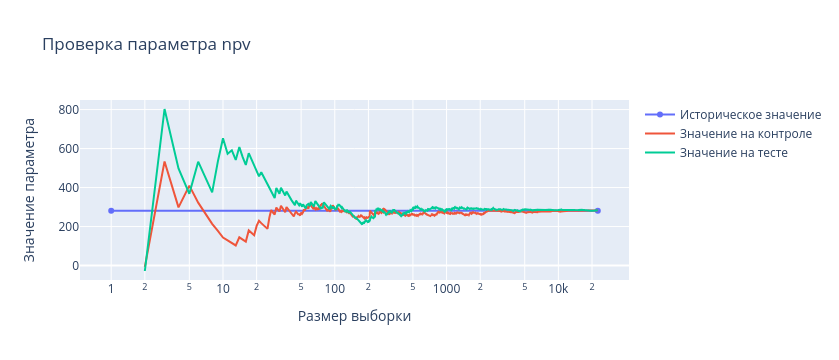

In [ ]:
secondary_metrics(df_hist_task_1, control_t1, test_t1, "npv")

Из графика очевидно, что метрика guardrall тестовой выборки аналогично целевой метрики не ухудшилась и немного быстрее преодолела "исторический" рубеж.

# Выводы

Проведен тест для определения статистически значимого снижения расходов на задание. 
В рамках теста поток пользователей разделен на две части рановероятно, объем каждой выборок составил 22361.
Контрольной выборке продажи осуществлены без автоматической системы дозвона, а тестовой - с ней.

Результаты теста показывают: 
- значения прокси метрик (доли дозвонов и покупок) практически не изменились от исторических значений;
- значение p-value равенства целевой метрики (средние расходы) составил примерно 0,05%, что на порядок меньше заданного уровеня значимости 0,5% и позволяет не отвергать гипотезу о снижении затрат;
- метрика guardrall (средний NPV) тестовой выборки аналогично целевой метрики не ухудшилась и намного быстрее преодолела "исторический" рубеж.

Учитывая изложенное, рекомендуется внедрение системы, которая будет сама звонить пользователю. 